<a href="https://colab.research.google.com/github/mellow-d/DailyCommit/blob/main/FraudDetectUsingGBM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
try:
    import pycaret
except:
    !pip install pycaret

try:
    import missingno
except:
    !pip install missingno

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.4/484.4 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.4/153.4 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.8/81.8 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 25.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 41.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 26.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 62.3 MB/s eta 0:

In [3]:
# Data manipulation libraries
import pandas as pd
import numpy as np

# Data visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Machine learning libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc
from pycaret.classification import *
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import f1_score, confusion_matrix, precision_recall_curve, roc_curve
from sklearn.metrics import ConfusionMatrixDisplay
from pycaret.classification import setup
from imblearn.over_sampling import SMOTE

# I installed the below code
!pip install umap
!pip install umap-learn[plot]
!pip install holoviews
!pip install -U ipykernel

# Data preprocessing and analysis libraries
import umap
import umap.plot
import scipy.stats as stats
from scipy.stats import norm, skew

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

  Preparing metadata (setup.py) ... done
  Created wheel for umap: filename=umap-0.1.1-py3-none-any.whl size=3541 sha256=6931858953163a81ea630edba757270a58d8d2c4ca06e69346857283598dee2f
  Stored in directory: /root/.cache/pip/wheels/15/f1/28/53dcf7a309118ed35d810a5f9cb995217800f3f269ab5771cb
Successfully built umap
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 834.7 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 49.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55615 sha256=177b26feb358348a61862eec237b6315b0708dc1acbf5e9f0037b4152ae131fc
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e835

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
card_df = pd.read_csv("/content/drive/MyDrive/fraudDetection/Base.csv")
card_org = card_df.copy()

# **Exploring Data**



> **Total Number of Transactions**



In [6]:
colors = ['#004B87', 'LightBlue']
labels = ['Non-Fraud', 'Fraud']
values = card_df['fraud_bool'].value_counts() / card_df['fraud_bool'].shape[0]
total_normal = card_df[card_df['fraud_bool'] == False].shape[0]
total_fraudulent = card_df[card_df['fraud_bool'] == True].shape[0]

fig = go.Figure(data=[go.Pie(labels=labels,
                             values=values, hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='percent', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='black', width=0.1)))

fig.update_layout(
    title_text='<b>Credit Card Fraud</b>',
    title_font_color='black',
    title_font=dict(size=24),
    legend_title_font_color='black',
    paper_bgcolor='white',
    plot_bgcolor='white',
    font_color='black',
)

fig.show()

In [7]:
card_df.head(5).T

,0,1,2,3,4
fraud_bool,1,1,1,1,1
income,0.9,0.9,0.9,0.9,0.9
name_email_similarity,0.166828,0.296286,0.044985,0.159511,0.596414
prev_address_months_count,-1,-1,-1,-1,-1
current_address_months_count,88,144,132,22,218
customer_age,50,50,40,50,50
days_since_request,0.020925,0.005418,3.108549,0.019079,0.004441
intended_balcon_amount,-1.331345,-0.816224,-0.755728,-1.205124,-0.773276
payment_type,AA,AB,AC,AB,AB
zip_count_4w,769,366,870,810,890


In [8]:
card_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 32 columns):
 #   Column                            Non-Null Count    Dtype  
---  ------                            --------------    -----  
 0   fraud_bool                        1000000 non-null  int64  
 1   income                            1000000 non-null  float64
 2   name_email_similarity             1000000 non-null  float64
 3   prev_address_months_count         1000000 non-null  int64  
 4   current_address_months_count      1000000 non-null  int64  
 5   customer_age                      1000000 non-null  int64  
 6   days_since_request                1000000 non-null  float64
 7   intended_balcon_amount            1000000 non-null  float64
 8   payment_type                      1000000 non-null  object 
 9   zip_count_4w                      1000000 non-null  int64  
 10  velocity_6h                       1000000 non-null  float64
 11  velocity_24h                      1000

In [9]:
card_df.describe()

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,zip_count_4w,velocity_6h,...,phone_mobile_valid,bank_months_count,has_other_cards,proposed_credit_limit,foreign_request,session_length_in_minutes,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
count,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1.000000e+06,1000000.000000,1000000.000000,1000000.000000,...,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.0,1000000.000000
mean,0.011029,0.562696,0.493694,16.718568,86.587867,33.689080,1.025705e+00,8.661499,1572.692049,5665.296605,...,0.889676,10.839303,0.222988,515.851010,0.025242,7.544940,0.576947,1.018312,0.0,3.288674
std,0.104438,0.290343,0.289125,44.046230,88.406599,12.025799,5.381835e+00,20.236155,1005.374565,3009.380665,...,0.313293,12.116875,0.416251,487.559902,0.156859,8.033106,0.494044,0.180761,0.0,2.209994
min,0.000000,0.100000,0.000001,-1.000000,-1.000000,10.000000,4.036860e-09,-15.530555,1.000000,-170.603072,...,0.000000,-1.000000,0.000000,190.000000,0.000000,-1.000000,0.000000,-1.000000,0.0,0.000000
25%,0.000000,0.300000,0.225216,-1.000000,19.000000,20.000000,7.193246e-03,-1.181488,894.000000,3436.365848,...,1.000000,-1.000000,0.000000,200.000000,0.000000,3.103053,0.000000,1.000000,0.0,1.000000
50%,0.000000,0.600000,0.492153,-1.000000,52.000000,30.000000,1.517574e-02,-0.830507,1263.000000,5319.769349,...,1.000000,5.000000,0.000000,200.000000,0.000000,5.114321,1.000000,1.000000,0.0,3.000000
75%,0.000000,0.800000,0.755567,12.000000,130.000000,40.000000,2.633069e-02,4.984176,1944.000000,7680.717827,...,1.000000,25.000000,0.000000,500.000000,0.000000,8.866131,1.000000,1.000000,0.0,5.000000
max,1.000000,0.900000,0.999999,383.000000,428.000000,90.000000,7.845690e+01,112.956928,6700.000000,16715.565404,...,1.000000,32.000000,1.000000,2100.000000,1.000000,85.899143,1.000000,2.000000,0.0,7.000000


**Checking missing Values**

<Axes: >

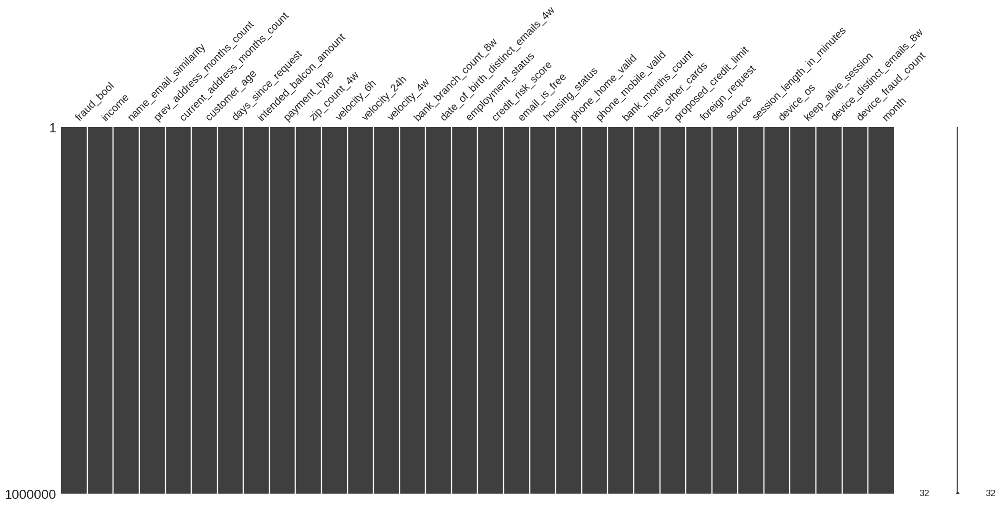

In [10]:
import missingno as msno
msno.matrix(card_df)



> ## <b>2.5 <span style='color:SteelBlue'>Check Data Types</span></b>



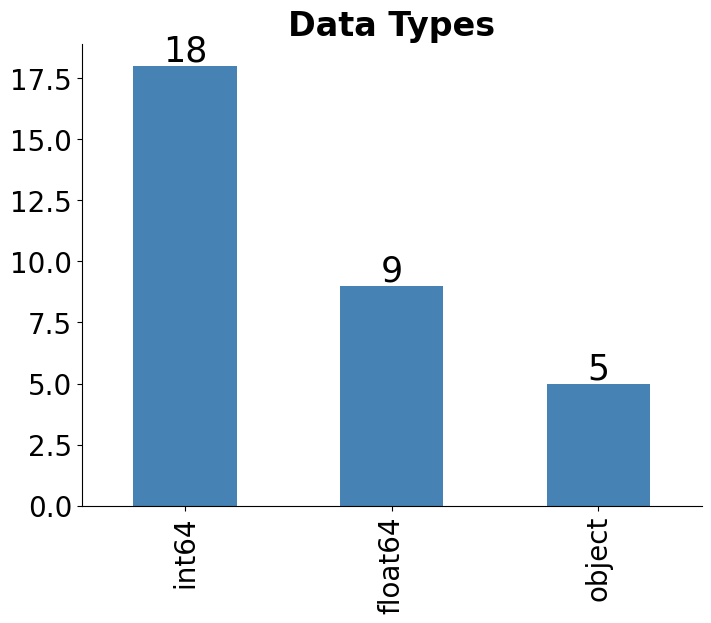

In [11]:
sns.set(style="ticks", context="talk",font_scale = 1)
plt.style.use("default")
plt.figure(figsize = (8,6))
ax = card_df.dtypes.value_counts().plot(kind='bar',grid = False,fontsize=20,color='SteelBlue')
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+ p.get_width() / 2., height + 0.2, height, ha = 'center', size = 25, color='black')
ax.set_title('Data Types', ha = 'center', weight='bold', fontsize=24)
sns.despine()
plt.show()

# **3. Data Preprocessing**



> ## <b>3.1 <span style='color:SteelBlue'>Random Sampling</span></b>



In [12]:
card_df = card_df.sample(n = 100000,random_state=42) # Random Sample 400.000 Rows
card_df.shape

(100000, 32)



> ## <b>3.2 <span style='color:SteelBlue'>One-Hot Encoding</span></b>



In [13]:
card_df = pd.get_dummies(card_df) # one hot encoding --> it makes the code in binary format i.e if the payment is of the form AA AB it creates new column for each
card_df.shape

(100000, 53)



> ## <b>3.3 <span style='color:SteelBlue'>Evaluate Skewness</span></b>



In [14]:
numerical_cols = [cname for cname in card_df.loc[:, :'month'].columns if
                  pd.to_numeric(card_df[cname], errors='coerce').notna().all() and
                  card_df[cname].min() >= 0 and
                  card_df[cname].dtype in ['int64', 'float64']]

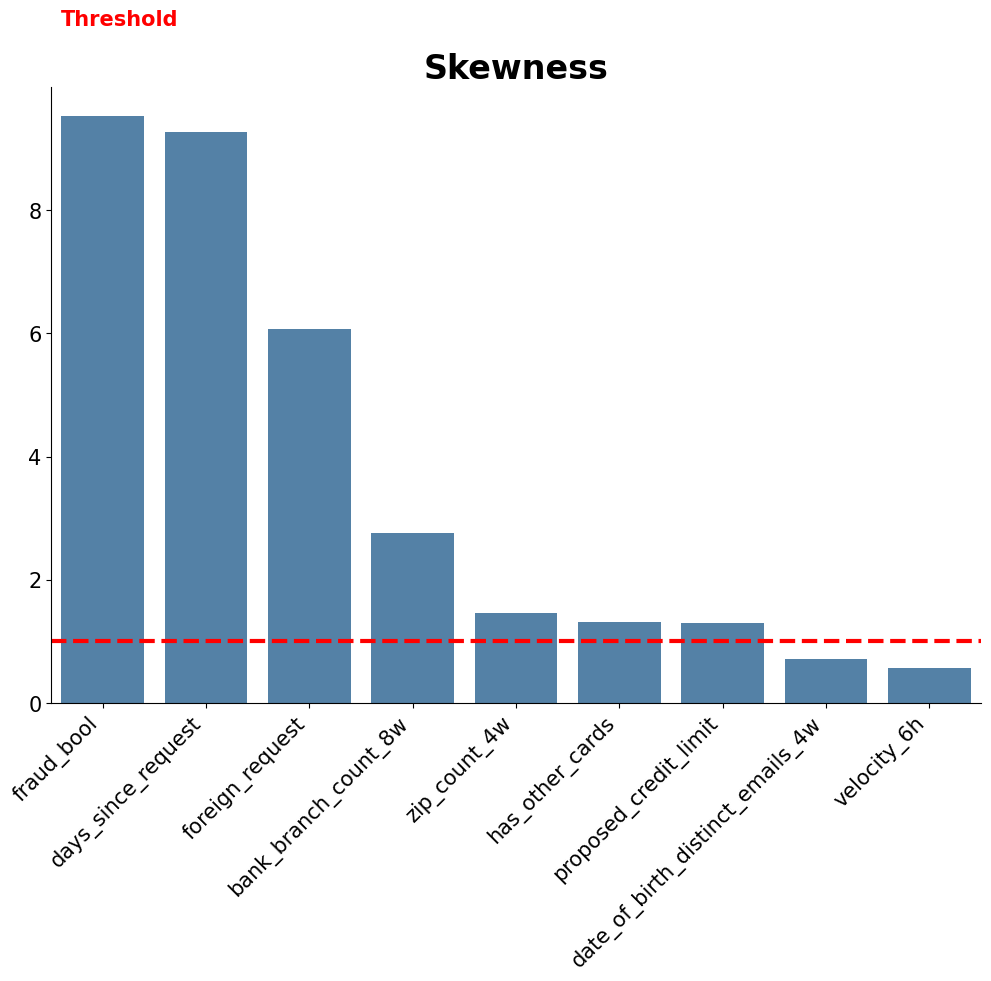

In [15]:
plt.figure(figsize=(12, 8))
skew_features = card_df[numerical_cols].apply(lambda x: skew(x))
skew_features = skew_features[skew_features > 0.5].sort_values(ascending=False)
ax = sns.barplot(x=skew_features.index, y=skew_features.values, color='SteelBlue')
ax.set_ylabel('', fontsize=20)
ax.set_xlabel('', fontsize=20)
ax.tick_params(axis='both', labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=15)
ax.axhline(y=1, color='red', linestyle='--', linewidth=3)
ax.set_title('Skewness', ha = 'center', weight='bold', fontsize=24)
ax.text(0.01, 1.1, 'Threshold', color='red', transform=ax.transAxes, fontsize=15, weight='bold')
sns.despine()
plt.gca().set_facecolor('white')
plt.show()



> ## <b>3.4 <span style='color:SteelBlue'>Check Feature Scaling</span></b>



In [16]:
def check_normality(features, data_frame):
    for feature in features:
        plt.figure(figsize = (8,8))
        ax1 = plt.subplot(1,1,1)
        stats.probplot(data_frame[feature], dist=stats.norm, plot=ax1)
        ax1.set_title(f'{feature} Q-Q plot', fontsize=20)
        sns.despine()

        mean = data_frame[feature].mean()
        std = data_frame[feature].std()
        skew = data_frame[feature].skew()
        print(f'{feature} : mean: {mean:.4f}, std: {std:.4f}, skew: {skew:.4f}')

days_since_request : mean: 1.0277, std: 5.3974, skew: 9.2643
zip_count_4w : mean: 1572.5755, std: 1008.0170, skew: 1.4588
proposed_credit_limit : mean: 517.4791, std: 488.8864, skew: 1.2935


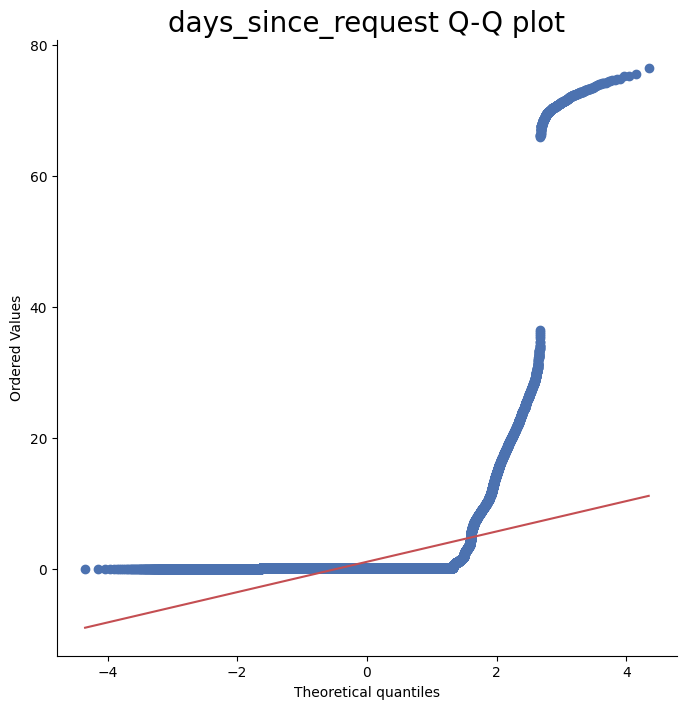

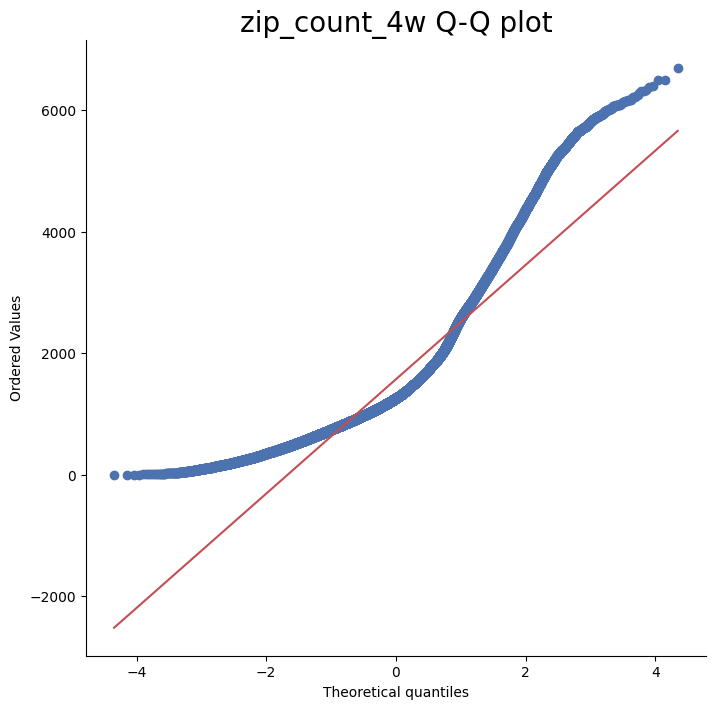

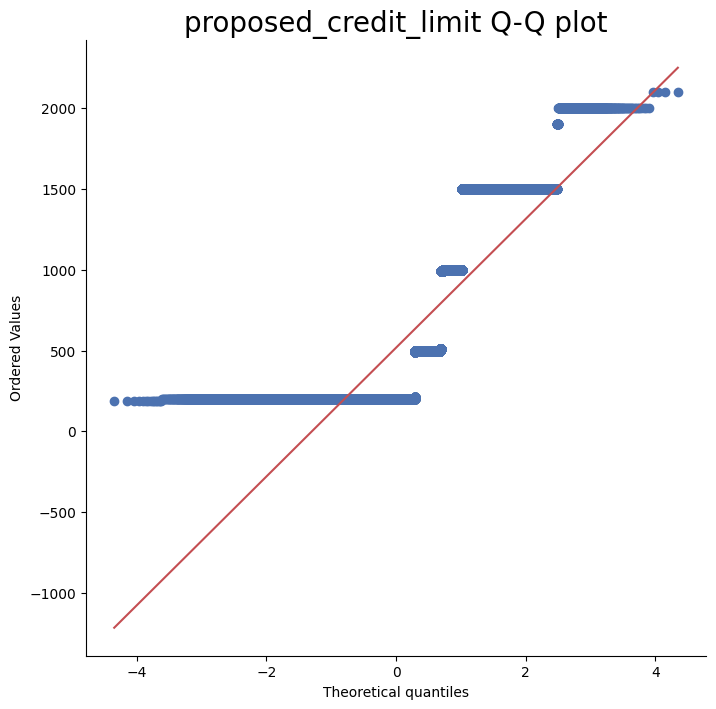

In [17]:
features = ['days_since_request', 'zip_count_4w', 'proposed_credit_limit']
check_normality(features, card_df)

In [18]:
def plot_histograms(features, data_frame, color=None):
    for feature in features:
        fig = px.histogram(data_frame, x=feature, color=color,
                            marginal="box",
                            barmode="overlay",
                            histnorm='density'
                            )
        fig.update_layout(
            title=f'Histogram of {feature}',
            xaxis_title=feature,
            yaxis_title='Density'
        )
        fig.show()

In [19]:
features = ['days_since_request', 'zip_count_4w', 'proposed_credit_limit']
plot_histograms(features, card_df, color='fraud_bool')



> ## <b>3.5 <span style='color:SteelBlue'>Logarithmic Scaling</span></b>



In [20]:
columns_to_transform = ['days_since_request', 'zip_count_4w', 'proposed_credit_limit']

# Apply natural logarithm transformation to specified columns
card_df[columns_to_transform] = np.log1p(card_df[columns_to_transform])

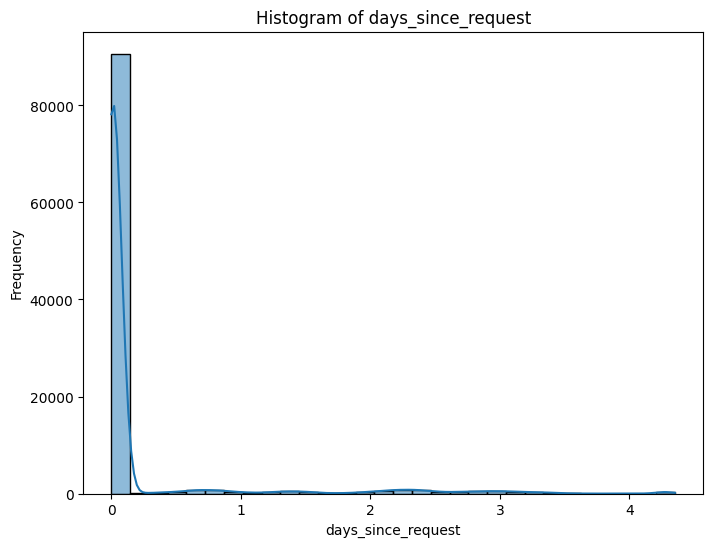

Normality test for days_since_request:
-------------------------------------
Skewness: 3.840393145023766
Kurtosis: 14.546917071839122
-------------------------------------



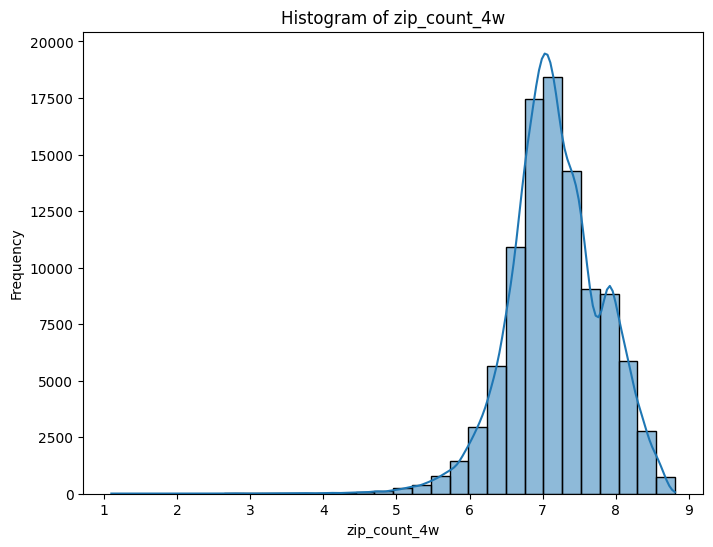

Normality test for zip_count_4w:
-------------------------------------
Skewness: -0.36015487122114986
Kurtosis: 1.4825426330494662
-------------------------------------



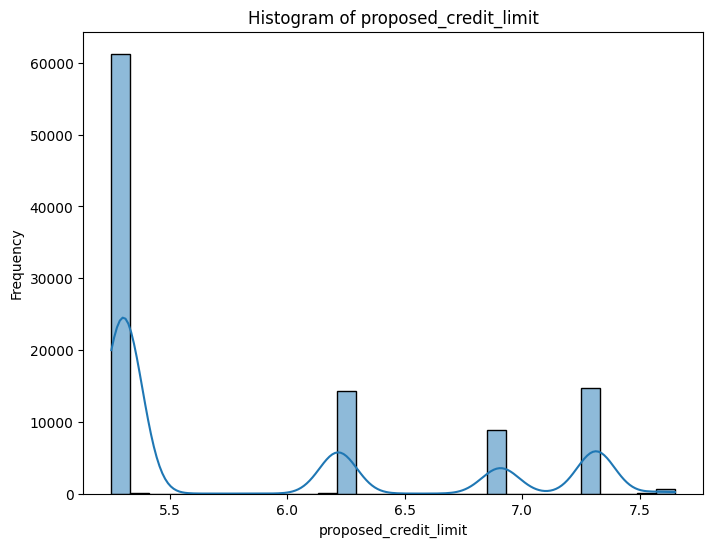

Normality test for proposed_credit_limit:
-------------------------------------
Skewness: 0.8579949916159146
Kurtosis: -0.9418071403337809
-------------------------------------



In [21]:
# Define a function to plot histogram and check normality
def plot_hist_and_check_normality(df, cols):
    for col in cols:
        # Plot histogram
        plt.figure(figsize=(8, 6))
        sns.histplot(df[col], bins=30, kde=True)
        plt.title(f'Histogram of {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.show()

        # Check normality
        print(f'Normality test for {col}:')
        print('-------------------------------------')
        print('Skewness:', skew(df[col]))
        print('Kurtosis:', df[col].kurtosis())
        print('-------------------------------------\n')

# Call the function with the desired variables
cols_to_plot = ['days_since_request', 'zip_count_4w', 'proposed_credit_limit']
plot_hist_and_check_normality(card_df, cols_to_plot)



> ## <b>3.6 <span style='color:SteelBlue'> Drop Highly Correlated Features</span></b>



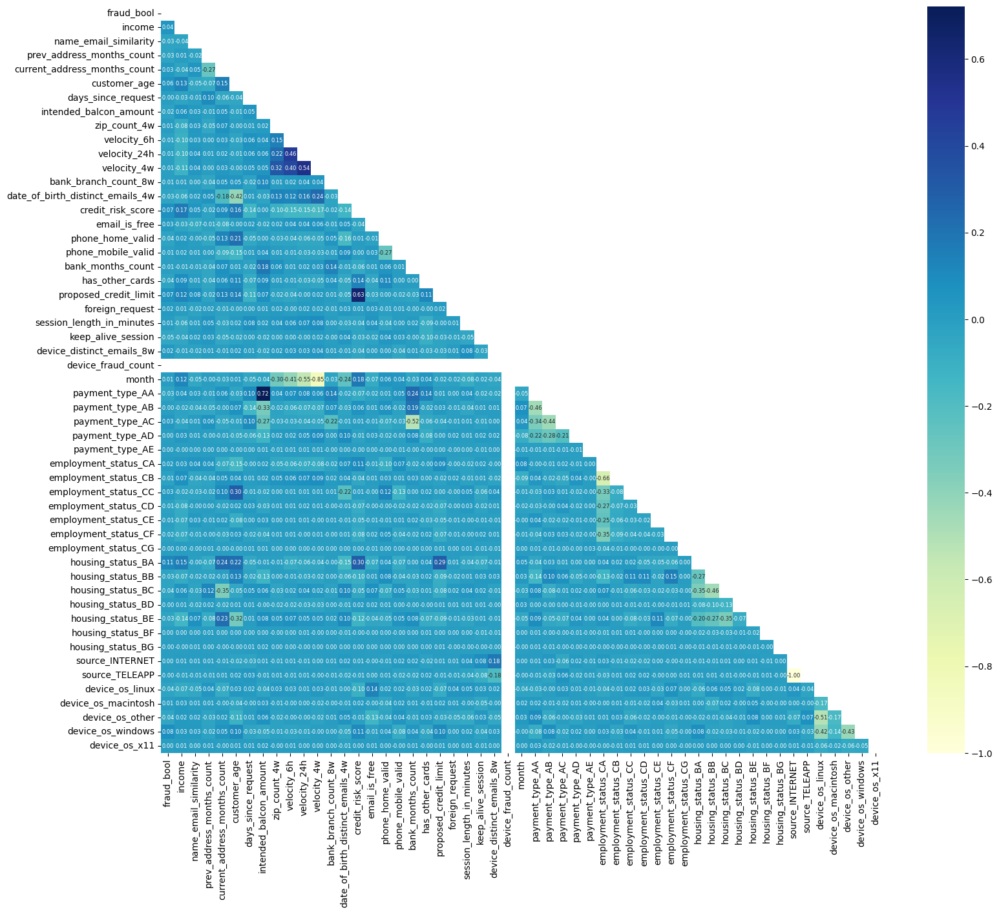

In [22]:
plt.figure(figsize=(18, 15))
cor = card_df.corr()
mask = np.triu(np.ones_like(cor))
heatmap = sns.heatmap(cor, mask=mask, annot=True, cmap=plt.cm.YlGnBu, annot_kws={"fontsize": 6}, fmt=".2f")  # Set fmt to ".2f" to display 2 decimals
plt.show()

In [23]:
# Function to drop correlated features
def correlation(dataset, threshold):
    col_corr = set ()
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if  (corr_matrix.iloc[i, j]) > threshold:
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [24]:
corr_features = correlation(card_df, 0.7)
print(corr_features)

{'payment_type_AA'}


In [25]:
card_df = card_df.drop('payment_type_AA', axis=1)



> ## <b>3.7 <span style='color:SteelBlue'> Identify Most Important Features</span></b>



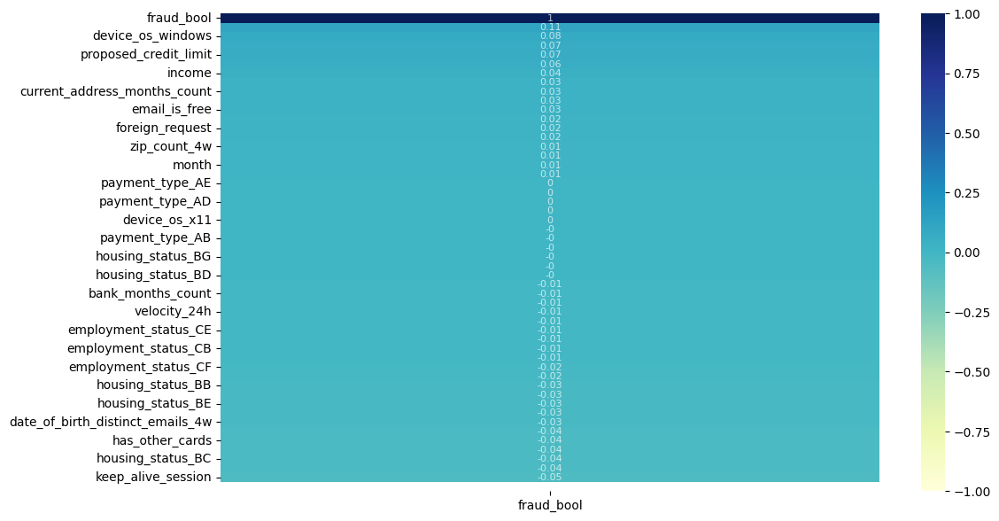

In [26]:
plt.figure(figsize=(12, 7), dpi=100)
corr = card_df.corr()[['fraud_bool']].sort_values(by='fraud_bool', ascending=False)
corr = corr.round(2)
heatmap = sns.heatmap(corr, vmin=-1, vmax=1, annot=True, cmap='YlGnBu', annot_kws={"size": 8, "color":'white', "alpha":0.7, "ha": 'center', "va": 'center'})


>> I made changes in below code



In [27]:
corr = card_df.corr().round(1)
# Find features with strong correlation with target
target_corr = corr['fraud_bool'].abs().sort_values(ascending=False)
strong_corr_features = target_corr.index[1:11]

print('Top 10 features with highest correlation with target:')
for feature in strong_corr_features:
    print(f"{feature}: {target_corr[feature]}")


# they were first rounding off then choosing which features were better ->making less correlated ones first because of alphabettical ordering
# corr = card_df.corr().round(1)

Top 10 features with highest correlation with target:
device_os_windows: 0.1
customer_age: 0.1
proposed_credit_limit: 0.1
housing_status_BA: 0.1
credit_risk_score: 0.1
housing_status_BB: 0.0
payment_type_AE: 0.0
employment_status_CA: 0.0
employment_status_CB: 0.0
employment_status_CC: 0.0




> ## <b>3.8 <span style='color:SteelBlue'>Check Feature Importance</span></b>



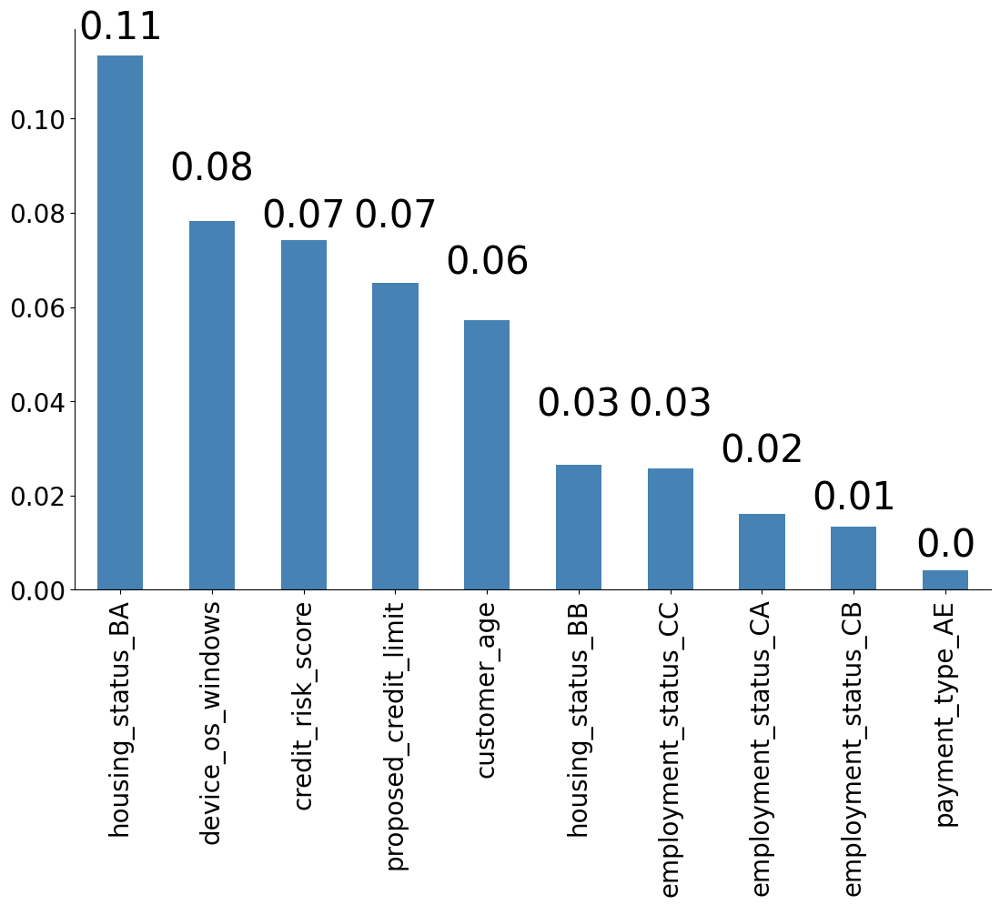

In [28]:
features = [
    "device_os_windows",
    "customer_age",
    "proposed_credit_limit",
    "housing_status_BA",
    "credit_risk_score",
    "housing_status_BB",
    "payment_type_AE",
    "employment_status_CA",
    "employment_status_CB",
    "employment_status_CC",
]

plt.figure(figsize=(13,8))
ax = abs(card_df[features].corrwith(card_df.fraud_bool)).sort_values(ascending=False).plot(kind='bar',color='SteelBlue',fontsize=20)
for p in ax.patches:
    height = p.get_height().round(2)
    ax.text(p.get_x() + p.get_width() / 2., height+0.007, height, ha = 'center', size = 30)
sns.despine()

# <b>4 <span style='color:SteelBlue'>|</span> Imbalanced Classification</b>



> ## <b>4.1 <span style='color:SteelBlue'>Splitting Train and Test Dataset</span></b>



In [29]:
def get_preprocessed_df(df=None):
    df_copy = df.copy()
    # Set 'fraud_bool' as the target variable by moving it to the first column
    target_col = df_copy.pop('fraud_bool')
    df_copy.insert(0, 'fraud_bool', target_col)
    return df_copy

def get_train_test_dataset(df=None):
    df_copy = get_preprocessed_df(df)
    X_features = df_copy.iloc[:, 1:]  # Exclude only the first column
    y_target = df_copy.iloc[:, 0]  # Use the first column as y-axis
    X_train, X_test, y_train, y_test = train_test_split(X_features,
                                                        y_target,
                                                        test_size=0.3,
                                                        random_state=0,
                                                        stratify=y_target)
    return X_train, X_test, y_train, y_test

In [30]:
X_train, X_test, y_train, y_test = get_train_test_dataset(card_df)

### **Histogram Plot**

In [31]:
# Create histogram plot
fig = px.histogram(card_df, x="customer_age",
                   color="fraud_bool",
                   marginal="box",
                   barmode="overlay",
                   histnorm='density'
                  )
fig.update_layout(
    title_text="Original Distribution",
    title_font_color="black",
    legend_title_font_color="black",
    paper_bgcolor="white",
    plot_bgcolor='white',
    font_color="black",
)
fig.show()


In [32]:
fig = px.scatter(card_df, x="customer_age", y="credit_risk_score", color="fraud_bool")
fig.update_layout(
    title_text="",
    title_font_color="black",
    legend_title_font_color="black",
    paper_bgcolor="white",
    plot_bgcolor='white',
    font_color="black",
)



> ## <b>4.2 <span style='color:SteelBlue'>Oversampling Using SMOTE</span></b>



In [33]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=0)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
print('Feature/label dataset for training before applying SMOTE: ', X_train.shape, y_train.shape)
print('Feature/label dataset for training after applying SMOTE: ', X_train_smote.shape, y_train_smote.shape)
print('Distribution of label values after applying SMOTE:\n',pd.Series(y_train_smote).value_counts())
card_df_smote = pd.concat([ y_train_smote,X_train_smote], axis=1)
card_df_smote.head()

Feature/label dataset for training before applying SMOTE:  (70000, 51) (70000,)
Feature/label dataset for training after applying SMOTE:  (138504, 51) (138504,)
Distribution of label values after applying SMOTE:
 0    69252
1    69252
Name: fraud_bool, dtype: int64


,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,zip_count_4w,velocity_6h,...,housing_status_BE,housing_status_BF,housing_status_BG,source_INTERNET,source_TELEAPP,device_os_linux,device_os_macintosh,device_os_other,device_os_windows,device_os_x11
0,0,0.9,0.391821,58,37,20,0.021206,-1.020814,6.084499,5835.695811,...,0,0,0,1,0,0,0,1,0,0
1,0,0.3,0.522739,-1,164,20,0.011303,-1.134116,8.068090,7878.561983,...,0,0,0,1,0,0,0,1,0,0
2,0,0.9,0.007726,-1,55,20,0.002153,-1.191635,6.030685,2432.838324,...,0,0,0,1,0,0,0,1,0,0
3,0,0.9,0.755652,-1,77,40,0.000407,-0.666417,7.026427,13227.396348,...,0,0,0,1,0,0,0,0,1,0
4,0,0.9,0.830538,51,19,40,0.022144,-0.283702,6.687109,4527.909160,...,0,0,0,1,0,1,0,0,0,0


### **Scatterplot**

In [34]:
fig = px.scatter(card_df_smote, x="customer_age", y="credit_risk_score", color="fraud_bool")
fig.update_layout(
    title_text="",
    title_font_color="black",
    legend_title_font_color="black",
    paper_bgcolor="white",
    plot_bgcolor='white',
    font_color="black",
)



> ## <b>4.3 <span style='color:SteelBlue'>UMAP Dimensionality Reduction</span></b>



<Axes: >

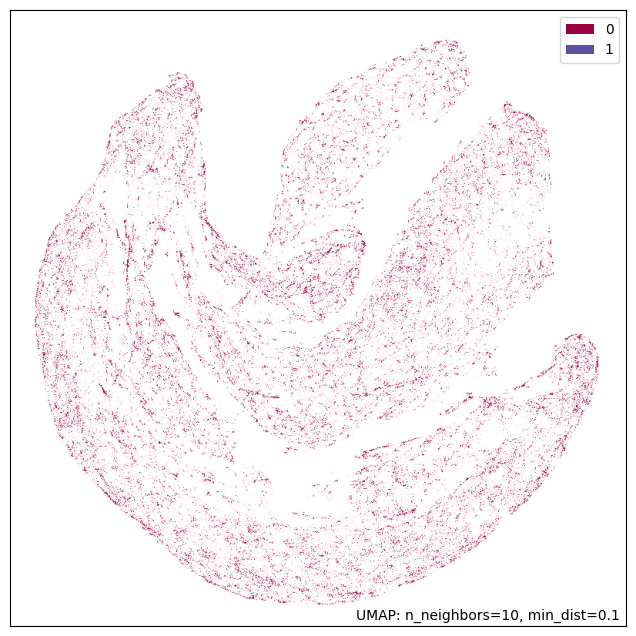

In [35]:
sns.set(style="ticks", context="talk",font_scale = 1)
plt.style.use("default")

mapper = umap.UMAP(n_neighbors=10, min_dist=0.1).fit(card_df.loc[:,:'month'])
umap.plot.points(mapper, labels=card_df.loc[:,'fraud_bool'])

In [36]:
# smote = SMOTE(random_state=0)
# X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
# print('Feature/label dataset for training before applying SMOTE: ', X_train.shape, y_train.shape)
# print('Feature/label dataset for training after applying SMOTE: ', X_train_smote.shape, y_train_smote.shape)
# print('Distribution of label values after applying SMOTE:\n',pd.Series(y_train_smote).value_counts())



> ## <b>4.4 <span style='color:SteelBlue'>Analysing Results</span></b>



In [37]:
train_df =pd.concat([X_train_smote,y_train_smote],axis=1)
X_test_smote, y_test_smote = smote.fit_resample(X_test, y_test)

In [38]:
colors = ['SteelBlue', '#004B87']
labels = ['Non-Fraud','Fraud']
values = train_df['fraud_bool'].value_counts() / train_df['fraud_bool'].shape[0]
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=0.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='percent', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='white', width=2)))
fig.update_layout(
    title_text='<b>Credit Card Fraud</b>',
    title_font_color='black',
    title_font=dict(size=24),
    legend_title_font_color='black',
    paper_bgcolor='white',
    plot_bgcolor='white',
    font_color='black',
)

fig.show()

In [39]:
classifier = setup(data=train_df, preprocess=False, target='fraud_bool', verbose=0)

# <b>5 <span style='color:SteelBlue'>|</span> Model Selection</b>

In [40]:
decisiontree = create_model('dt') # decision tree
gbm = create_model('gbc', n_estimators=30) # gradient boosting machine
logisticregression = create_model('lr') # logistic regression

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9797,0.9797,0.9845,0.9751,0.9798,0.9594,0.9594
1,0.9811,0.9811,0.9870,0.9755,0.9812,0.9623,0.9623
2,0.9858,0.9858,0.9878,0.9838,0.9858,0.9715,0.9715
3,0.9843,0.9843,0.9887,0.9802,0.9844,0.9686,0.9687
4,0.9812,0.9812,0.9878,0.9750,0.9813,0.9625,0.9625
5,0.9834,0.9834,0.9864,0.9805,0.9834,0.9668,0.9668
6,0.9848,0.9848,0.9895,0.9804,0.9849,0.9697,0.9697
7,0.9825,0.9825,0.9882,0.9770,0.9826,0.9649,0.9650
8,0.9816,0.9816,0.9887,0.9750,0.9818,0.9633,0.9634


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9475,0.9885,0.9633,0.9338,0.9483,0.8950,0.8955
1,0.9485,0.9884,0.9612,0.9374,0.9492,0.8971,0.8974
2,0.9468,0.9873,0.9577,0.9372,0.9473,0.8936,0.8938
3,0.9553,0.9901,0.9655,0.9462,0.9558,0.9107,0.9109
4,0.9471,0.9887,0.9598,0.9360,0.9477,0.8942,0.8945
5,0.9482,0.9893,0.9606,0.9374,0.9488,0.8964,0.8967
6,0.9480,0.9886,0.9557,0.9413,0.9484,0.8960,0.8961
7,0.9514,0.9894,0.9662,0.9385,0.9521,0.9028,0.9032
8,0.9536,0.9899,0.9662,0.9425,0.9542,0.9072,0.9075


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7857,0.8610,0.7826,0.7875,0.7850,0.5714,0.5714
1,0.7652,0.8408,0.7554,0.7705,0.7628,0.5303,0.5304
2,0.7638,0.8422,0.7427,0.7754,0.7587,0.5276,0.5281
3,0.7583,0.8384,0.7458,0.7649,0.7552,0.5167,0.5168
4,0.7614,0.8347,0.7613,0.7615,0.7614,0.5228,0.5228
5,0.7725,0.8499,0.7766,0.7702,0.7734,0.5449,0.5449
6,0.7527,0.8272,0.7508,0.7536,0.7522,0.5053,0.5053
7,0.7585,0.8343,0.7434,0.7666,0.7548,0.5171,0.5173
8,0.7350,0.8103,0.7294,0.7377,0.7335,0.4700,0.4701


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

>## <b>5.2 <span style='color:SteelBlue'>Hyperparameter tuning</span></b>

In [41]:
tuned_decisiontree = tune_model(decisiontree, optimize = 'AUC')
tuned_gradientboosting = tune_model(gbm, optimize = 'AUC')
tuned_logisticregression = tune_model(logisticregression, optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9578,0.9856,0.9658,0.9507,0.9582,0.9156,0.9158
1,0.9569,0.9864,0.9676,0.9473,0.9573,0.9138,0.9140
2,0.9592,0.9835,0.9604,0.9580,0.9592,0.9183,0.9183
3,0.9620,0.9887,0.9674,0.9571,0.9622,0.9241,0.9241
4,0.9616,0.9841,0.9672,0.9565,0.9618,0.9233,0.9233
5,0.9603,0.9859,0.9573,0.9631,0.9602,0.9206,0.9206
6,0.9594,0.9857,0.9666,0.9528,0.9597,0.9187,0.9188
7,0.9639,0.9833,0.9736,0.9551,0.9642,0.9278,0.9280
8,0.9599,0.9820,0.9567,0.9628,0.9598,0.9198,0.9198


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9934,0.9992,0.9901,0.9967,0.9934,0.9868,0.9868
1,0.9930,0.9987,0.9893,0.9967,0.9930,0.9860,0.9860
2,0.9937,0.9987,0.9889,0.9985,0.9937,0.9874,0.9875
3,0.9941,0.9993,0.9911,0.9971,0.9941,0.9882,0.9883
4,0.9933,0.9990,0.9899,0.9967,0.9933,0.9866,0.9866
5,0.9927,0.9990,0.9889,0.9965,0.9926,0.9854,0.9854
6,0.9946,0.9991,0.9920,0.9973,0.9946,0.9893,0.9893
7,0.9943,0.9992,0.9917,0.9969,0.9943,0.9887,0.9887
8,0.9947,0.9992,0.9915,0.9979,0.9947,0.9895,0.9895


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7819,0.8615,0.7781,0.7840,0.7810,0.5637,0.5638
1,0.7861,0.8612,0.7766,0.7916,0.7840,0.5722,0.5723
2,0.7778,0.8511,0.7720,0.7810,0.7765,0.5556,0.5557
3,0.7857,0.8656,0.7741,0.7924,0.7831,0.5713,0.5715
4,0.7764,0.8520,0.7753,0.7769,0.7761,0.5528,0.5528
5,0.7707,0.8433,0.7665,0.7730,0.7697,0.5414,0.5414
6,0.7750,0.8512,0.7715,0.7771,0.7742,0.5501,0.5501
7,0.7822,0.8576,0.7723,0.7879,0.7800,0.5643,0.5644
8,0.7810,0.8576,0.7665,0.7895,0.7778,0.5620,0.5623


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


>## <b>5.3 <span style='color:SteelBlue'>Interpretating Models</span></b>

>>### <b>5.3.1 <span style='color:SteelBlue'>Decision Tree</span></b>

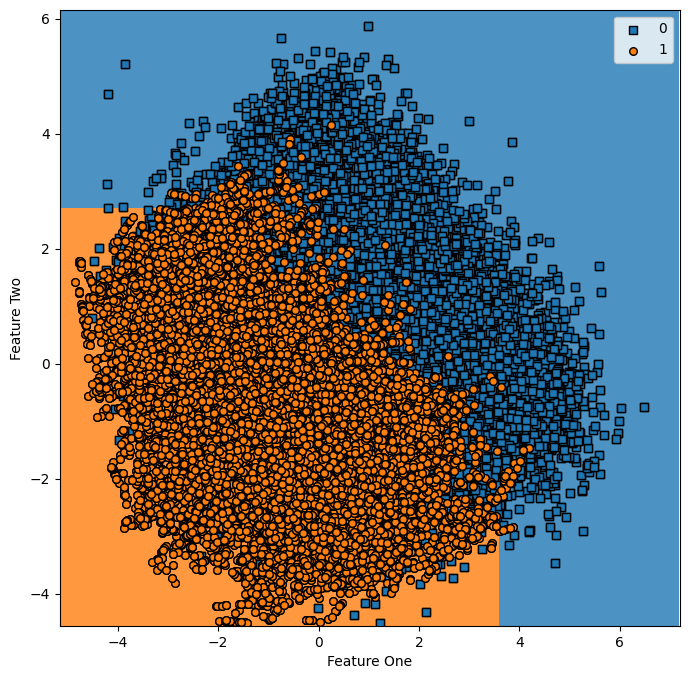

In [42]:
plt.figure(figsize=(8, 8))
plot_model(tuned_decisiontree, plot='boundary')

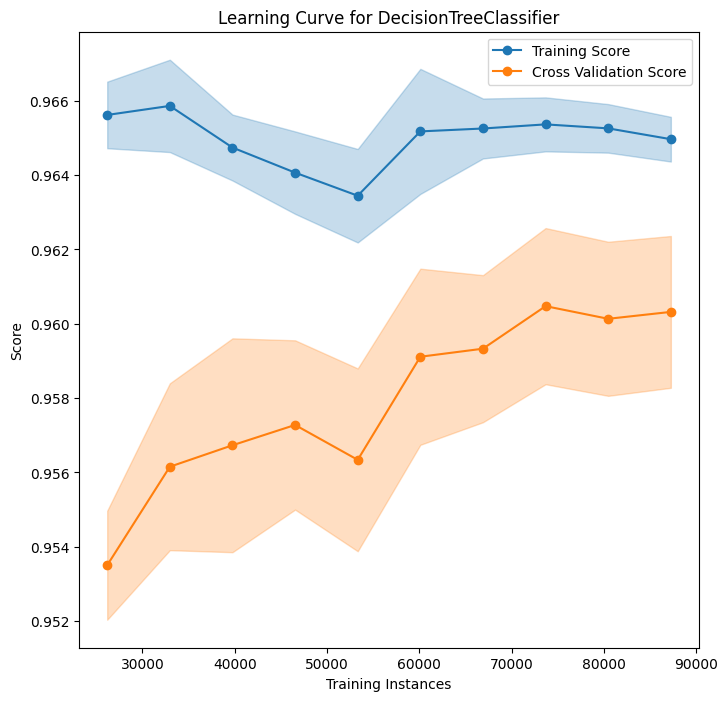

In [43]:
plt.figure(figsize=(8, 8))
plot_model(tuned_decisiontree, plot='learning')

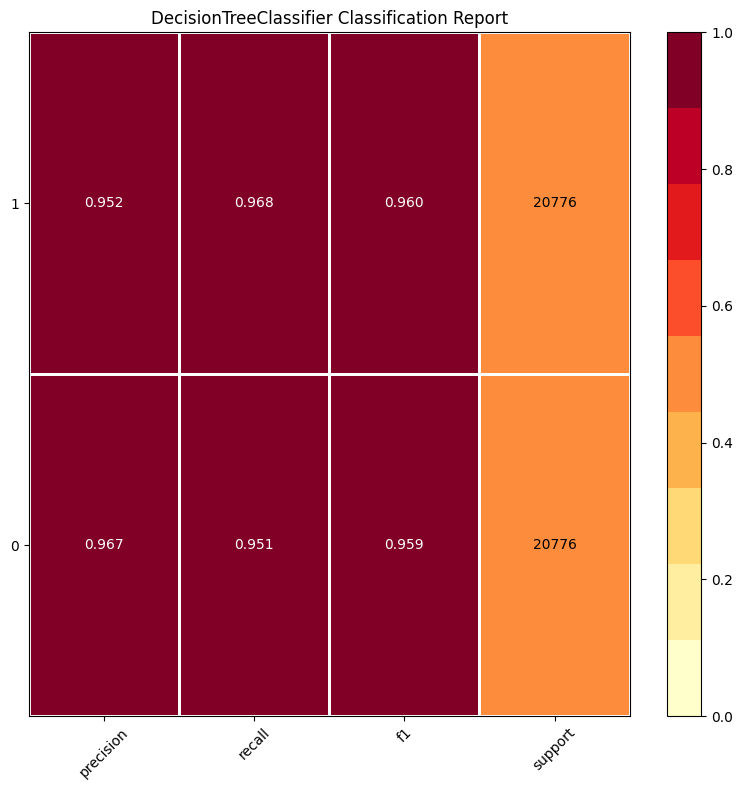

In [44]:
plt.figure(figsize=(8, 8))
plot_model(tuned_decisiontree, plot='class_report')

>>### <b>5.3.2 <span style='color:SteelBlue'>Gradient Boosting Machine</span></b>

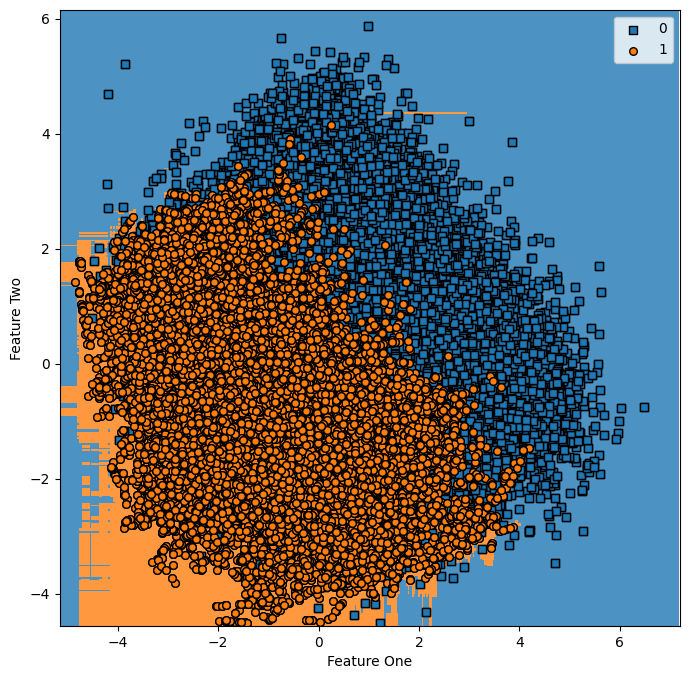

In [45]:
plt.figure(figsize=(8, 8))
plot_model(tuned_gradientboosting, plot='boundary')

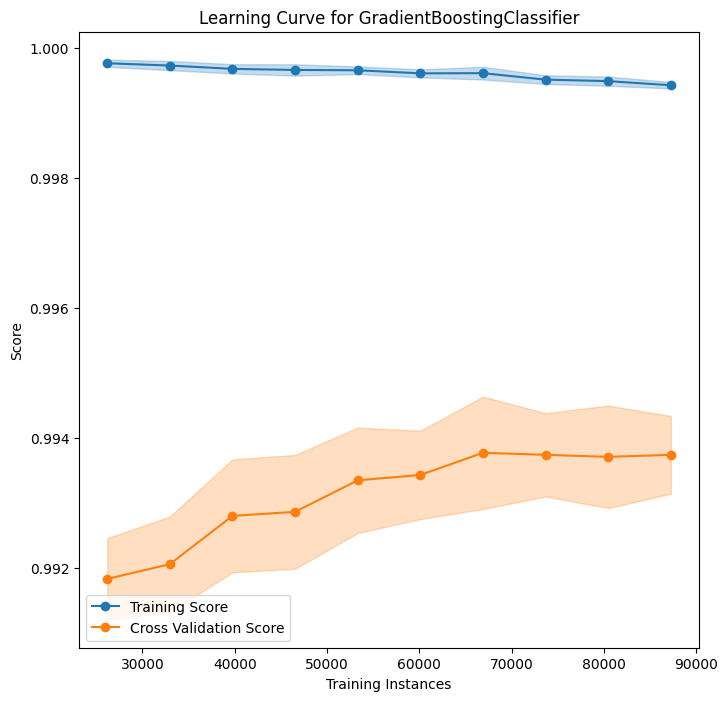

In [46]:
plt.figure(figsize=(8, 8))
plot_model(tuned_gradientboosting, plot='learning')

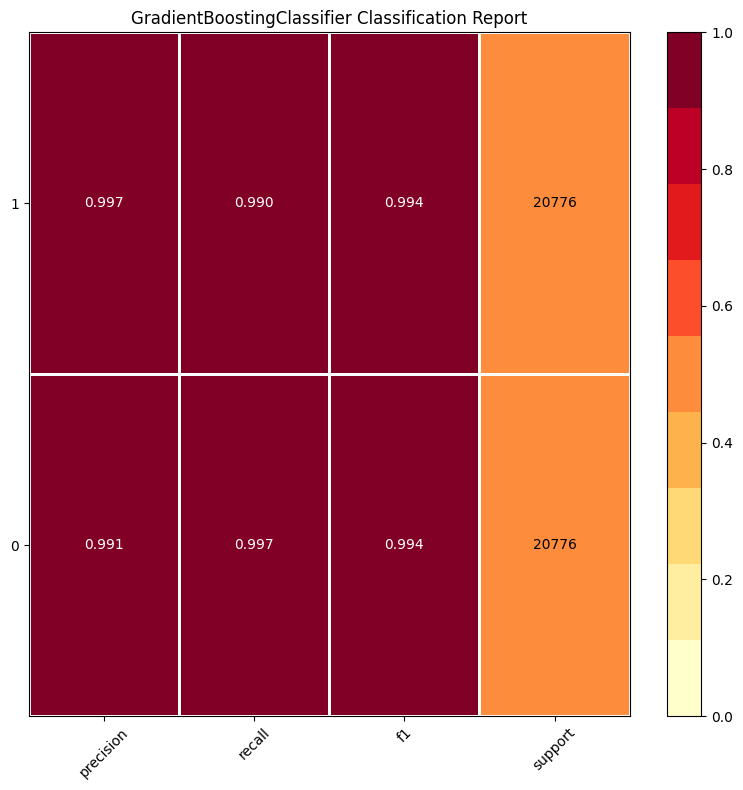

In [47]:
plt.figure(figsize=(8, 8))
plot_model(tuned_gradientboosting, plot='class_report')

>>### <b>5.3.3 <span style='color:SteelBlue'>Logistic Regression</span></b>

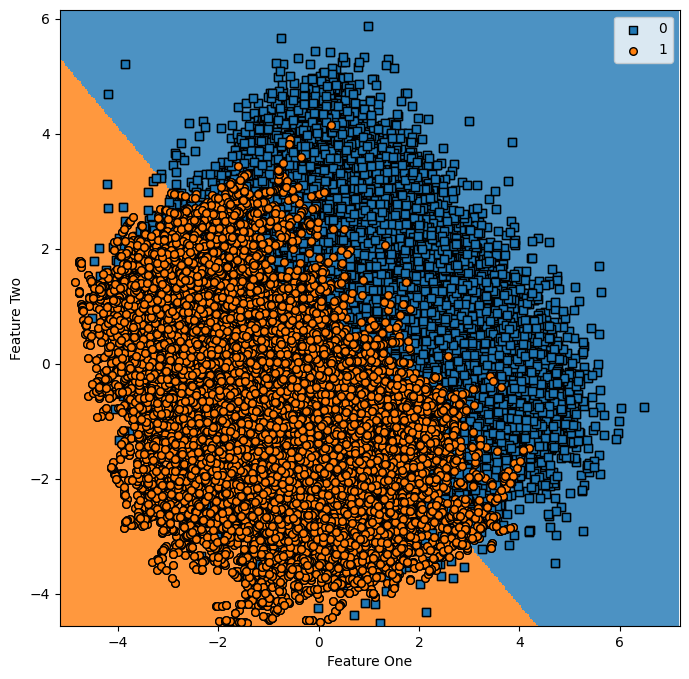

In [48]:
plt.figure(figsize=(8, 8))
plot_model(tuned_logisticregression, plot='boundary')

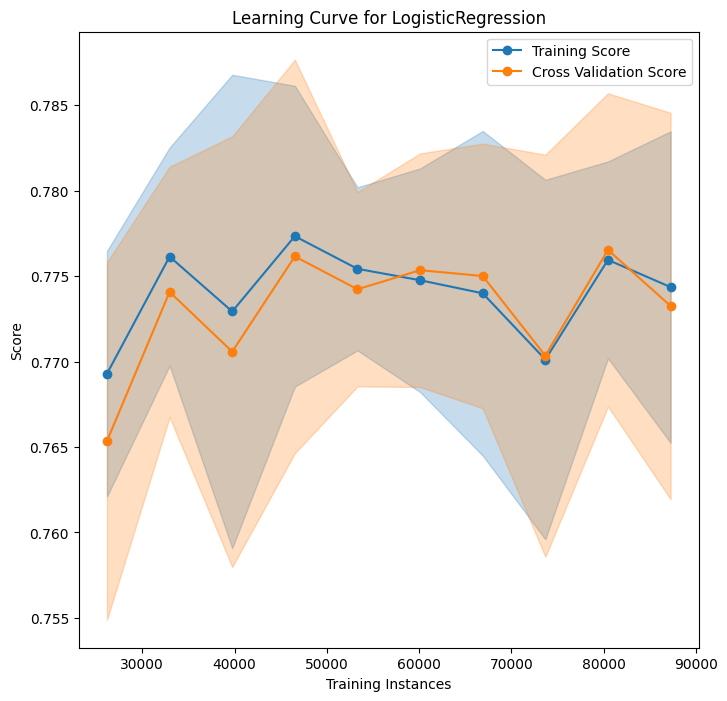

In [49]:
plt.figure(figsize=(8, 8))
plot_model(tuned_logisticregression, plot='learning')

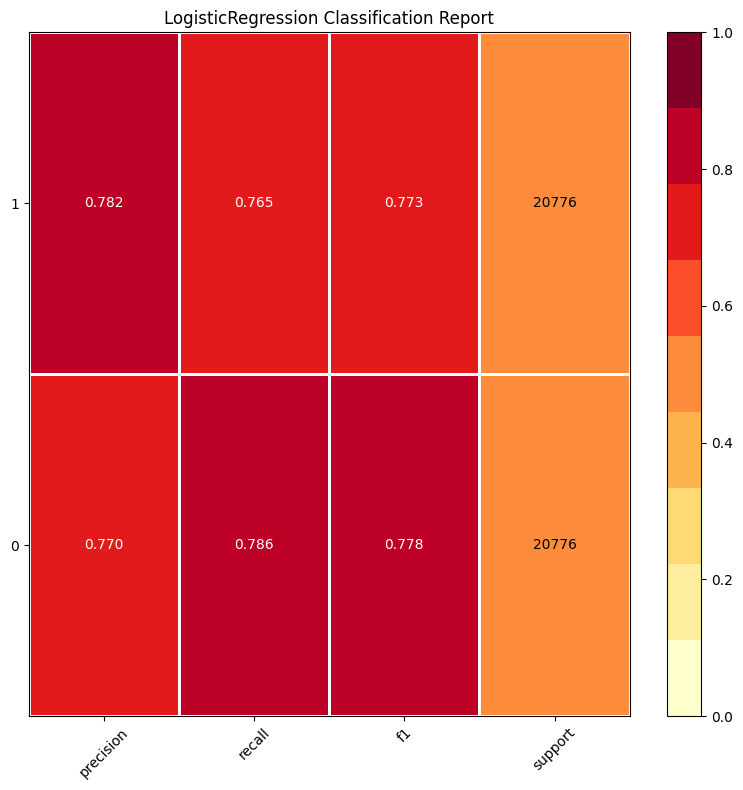

In [50]:
plt.figure(figsize=(8, 8))
plot_model(tuned_logisticregression, plot='class_report')

# <b>6 <span style='color:SteelBlue'>|</span> Model Evaluation</b>

>### <b>6.1 <span style='color:SteelBlue'>Decision Tree</span></b>

In [51]:
pred = tuned_decisiontree.predict(X_test_smote)

In [52]:
final_model_result = confusion_matrix(y_test_smote, pred)
accuracy = accuracy_score(y_test_smote , pred)
precision = precision_score(y_test_smote , pred)
recall = recall_score(y_test_smote , pred)
f1 = f1_score(y_test_smote,pred)
print('accuracy: {0:.4f}, precision: {1:.4f}, recall: {2:.4f},\
F1: {3:.4f}'.format(accuracy, precision, recall, f1))

accuracy: 0.9247, precision: 0.9485, recall: 0.8981,F1: 0.9227


Text(0.5, 1.0, 'Confusion Matrix (Decision Tree Classifier)')

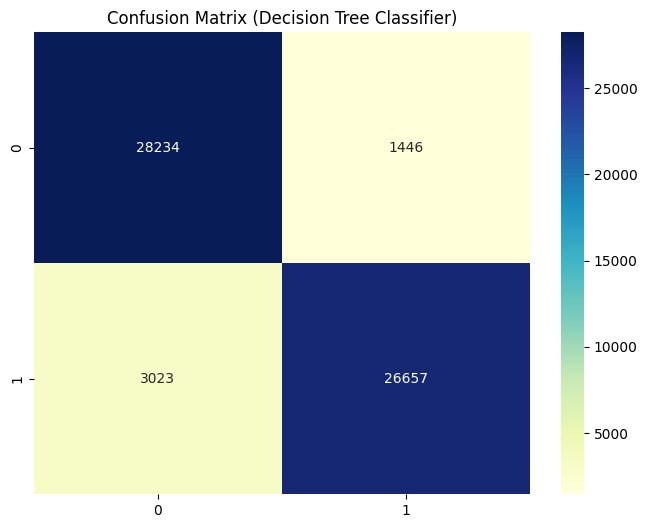

In [53]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(final_model_result, cmap = 'YlGnBu',annot = True, fmt='d')
ax.set_title('Confusion Matrix (Decision Tree Classifier)')

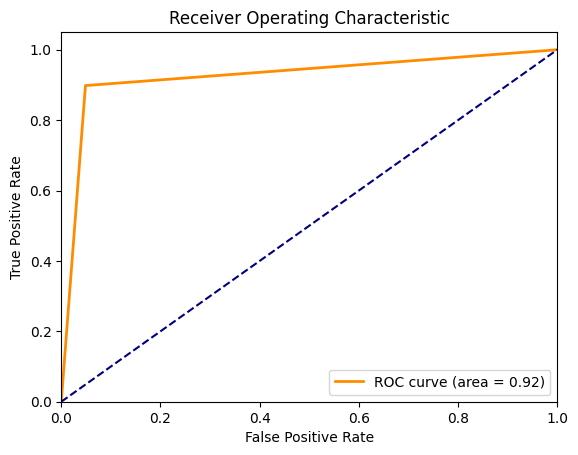

AUC: 0.9247


In [54]:
# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test_smote, pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print('AUC: {0:.4f}'.format(roc_auc))

>### <b>6.2 <span style='color:SteelBlue'>Gradient Boosting Machine</span></b>

In [55]:
pred = tuned_gradientboosting.predict(X_test_smote)

In [56]:
final_model_result = confusion_matrix(y_test_smote, pred)
accuracy = accuracy_score(y_test_smote , pred)
precision = precision_score(y_test_smote , pred)
recall = recall_score(y_test_smote , pred)
f1 = f1_score(y_test_smote,pred)
print('accuracy: {0:.4f}, precision: {1:.4f}, recall: {2:.4f},\
F1: {3:.4f}'.format(accuracy, precision, recall, f1))

accuracy: 0.9837, precision: 0.9973, recall: 0.9701,F1: 0.9835


Text(0.5, 1.0, 'Confusion Matrix (GBM Classifier)')

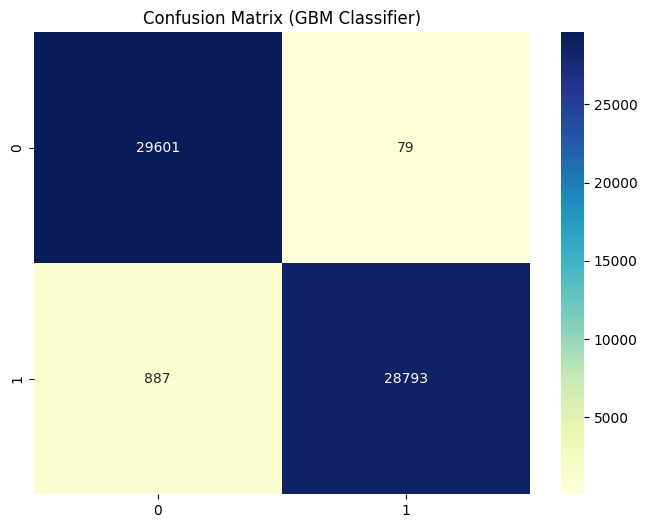

In [57]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(final_model_result, cmap = 'YlGnBu',annot = True, fmt='d')
ax.set_title('Confusion Matrix (GBM Classifier)')

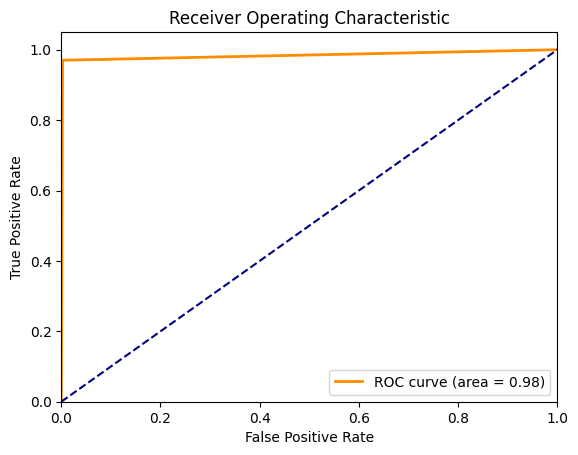

AUC: 0.9837


In [58]:
# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test_smote, pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print('AUC: {0:.4f}'.format(roc_auc))

>### <b>6.3 <span style='color:SteelBlue'>Logistic Regression</span></b>

In [59]:
pred = tuned_logisticregression.predict(X_test_smote)

In [60]:
final_model_result = confusion_matrix(y_test_smote, pred)
accuracy = accuracy_score(y_test_smote , pred)
precision = precision_score(y_test_smote , pred)
recall = recall_score(y_test_smote , pred)
f1 = f1_score(y_test_smote,pred)
print('accuracy: {0:.4f}, precision: {1:.4f}, recall: {2:.4f},\
F1: {3:.4f}'.format(accuracy, precision, recall, f1))

accuracy: 0.8011, precision: 0.7885, recall: 0.8228,F1: 0.8053


Text(0.5, 1.0, 'Confusion Matrix (Logistic Regression)')

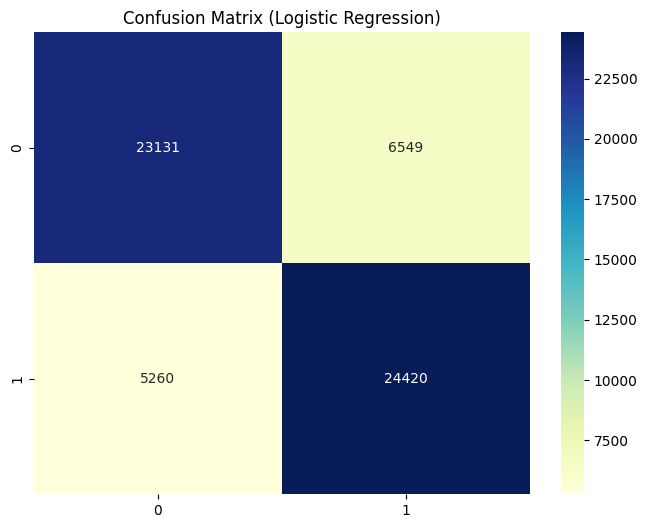

In [61]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(final_model_result, cmap = 'YlGnBu',annot = True, fmt='d')
ax.set_title('Confusion Matrix (Logistic Regression)')

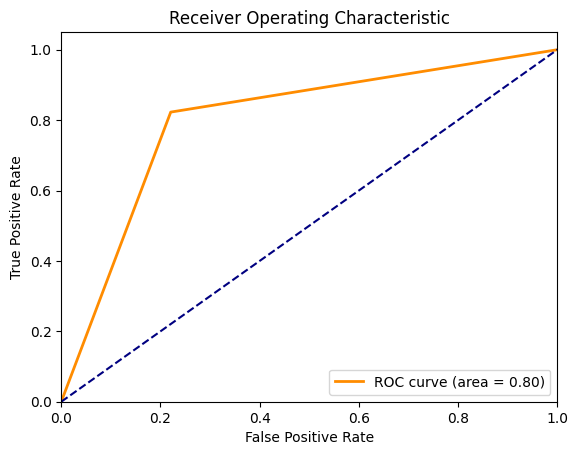

AUC: 0.8011


In [62]:
# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test_smote, pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print('AUC: {0:.4f}'.format(roc_auc))

# <b>7 <span style='color:SteelBlue'>|</span> Final Comparation</b>

>### <b>7.1 <span style='color:SteelBlue'>Evaluation Metrics</span></b>

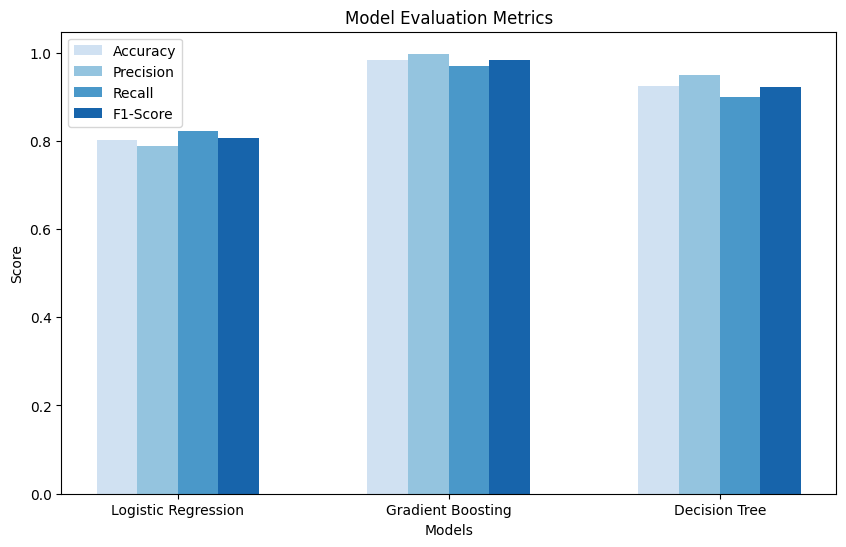

In [63]:
# Calculate evaluation metrics for each model
models = [tuned_logisticregression, tuned_gradientboosting, tuned_decisiontree]
model_names = ['Logistic Regression', 'Gradient Boosting', 'Decision Tree']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

scores = []

for model in models:
    y_pred = model.predict(X_test_smote)
    accuracy = accuracy_score(y_test_smote, y_pred)
    precision = precision_score(y_test_smote, y_pred)
    recall = recall_score(y_test_smote, y_pred)
    f1 = f1_score(y_test_smote, y_pred)
    scores.append([accuracy, precision, recall, f1])

colors = plt.cm.Blues(np.linspace(0.2, 0.8, len(metrics)))

# Plot the bar plot
plt.figure(figsize=(10, 6))
x = np.arange(len(model_names))
width = 0.15

for i, metric in enumerate(metrics):
    plt.bar(x + (i * width), [score[i] for score in scores], width, label=metric, color=colors[i])

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Model Evaluation Metrics')
plt.xticks(x + (width * 1.5), model_names)
plt.legend()

>### <b>7.2 <span style='color:SteelBlue'>Precision-Recall Curve</span></b>

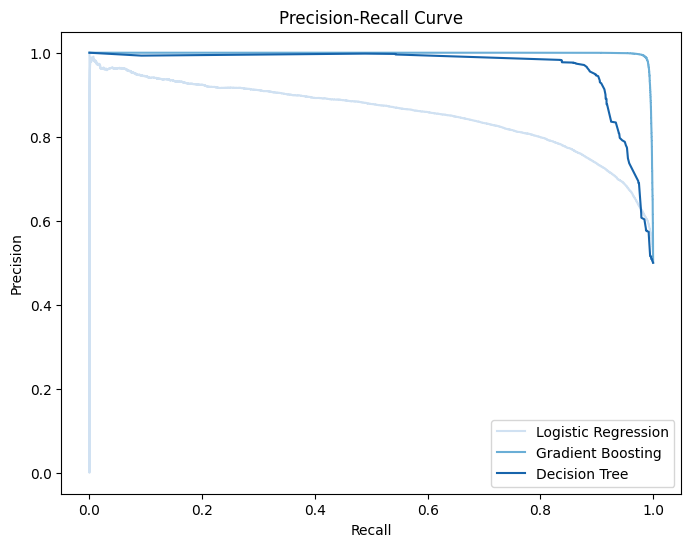

In [64]:
# Calculate precision and recall for each model
models = [tuned_logisticregression, tuned_gradientboosting, tuned_decisiontree]
model_names = ['Logistic Regression', 'Gradient Boosting', 'Decision Tree']

plt.figure(figsize=(8, 6))

colors = plt.cm.Blues(np.linspace(0.2, 0.8, len(models)))

for model, name, color in zip(models, model_names, colors):
    y_pred_prob = model.predict_proba(X_test_smote)[:, 1]
    precision, recall, _ = precision_recall_curve(y_test_smote, y_pred_prob)
    plt.plot(recall, precision, label=name, color=color)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower right')

plt.show()

>### <b>7.3 <span style='color:SteelBlue'>Receiver Operating Characteristic (ROC)</span></b>

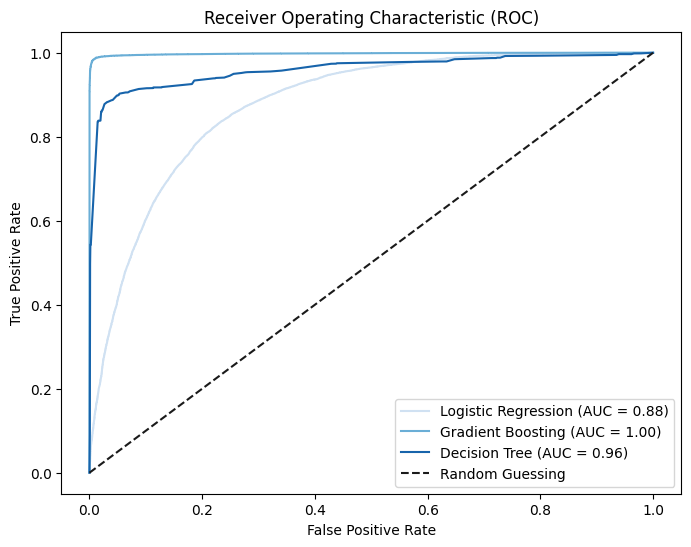

In [66]:
# Calculate the ROC curve and AUC for each model
models = [tuned_logisticregression, tuned_gradientboosting, tuned_decisiontree]
model_names = ['Logistic Regression', 'Gradient Boosting', 'Decision Tree']

plt.figure(figsize=(8, 6))

colors = plt.cm.Blues(np.linspace(0.2, 0.8, len(models)))

for model, name, color in zip(models, model_names, colors):
    y_pred_prob = model.predict_proba(X_test_smote)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test_smote, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})', color=color)

plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')

plt.show()